<a href="https://colab.research.google.com/github/Doyinakinloye/Dog-Vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-End Multi-Class Dog Breed Classification

This notebook builds an end-to-end Multi-class image Classifier using TensorFlow and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When i'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is

## 2. Data

The data we're using is from Kaggle's dog breed Identification Competition.
https://www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation
## 4. Features
Some information about the data:
* We're dealing with images (unstructured Data) so its best we use Deep Learning/Transfer Learning.
* There are 120 breeds of dogs (This means there are 120 different classes).
* There are around 10,000+ images in the training set(These images have labels)
* There are around 10,000+ images in the test set(These iamges have no labels, because we'll want to predict them).

In [ ]:
# Unzip the Uploaded data into Google Drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification (1).zip" -d "drive/MyDrive/Dog Vision"

### Get our Workspace ready
* Import TensorFlow 2.15
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import TensorFlow into Collab
import tensorflow as tf
print("TF version: ", tf.__version__)

TF version:  2.19.0


In [ ]:
# Import TensowFlow Hub into collab
import tensorflow_hub as hub
print("Tf Hub Version: ", hub.__version__)

Tf Hub Version:  0.16.1


In [ ]:
# Check for GPU availability
print("GPU", "available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available : (")

GPU available (YESSSSS!!!!)


## Getting our data ready (Turning into Tensors)

With all machine Learning models, our data has to be in numerical format. So that's we'll be doing first, turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
import os
Labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(Labels_csv.describe())
print(Labels_csv.head())

In [ ]:
Labels_csv.head(20)

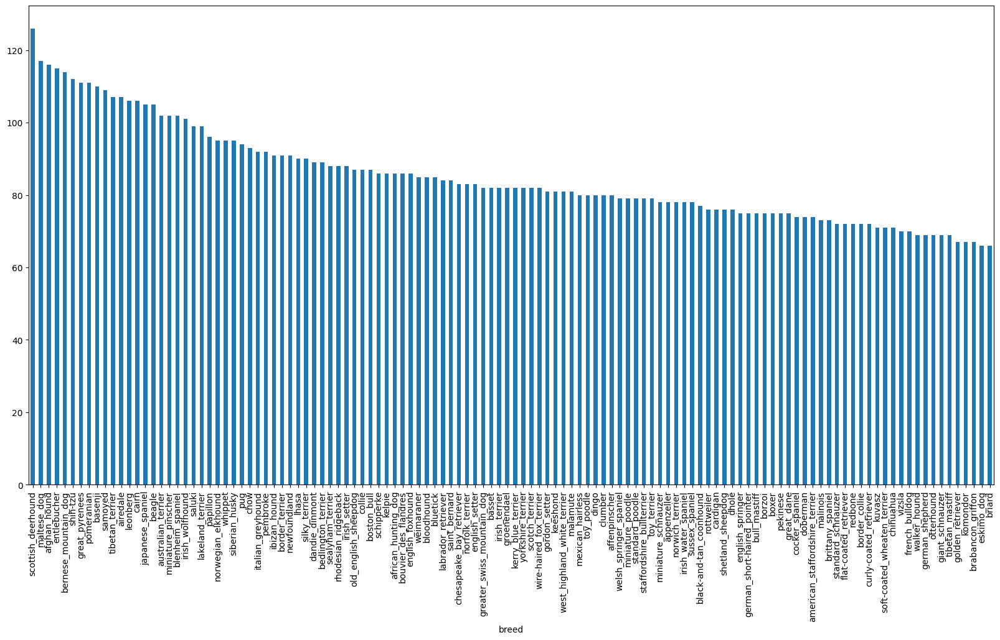

In [ ]:
# How many images are there per class
Labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
# Let's find out the median of the breed
Labels_csv["breed"].value_counts().median()

82.0

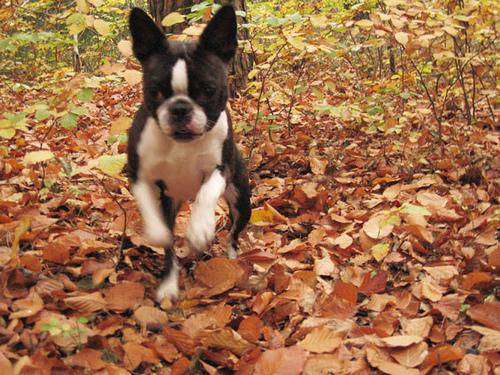

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their Labels
Let's get a list of all our images and their file pathnames.

In [ ]:
# Create pathname from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in Labels_csv["id"]]
filenames[:20]

In [ ]:
# Check if number of filenames matches number of actual image files
if len(filenames) == Labels_csv.shape[0]:
  print("cool. Ready to go😎")
else:
  print("Error")

cool. Ready to go😎


In [ ]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!!! Proceed.


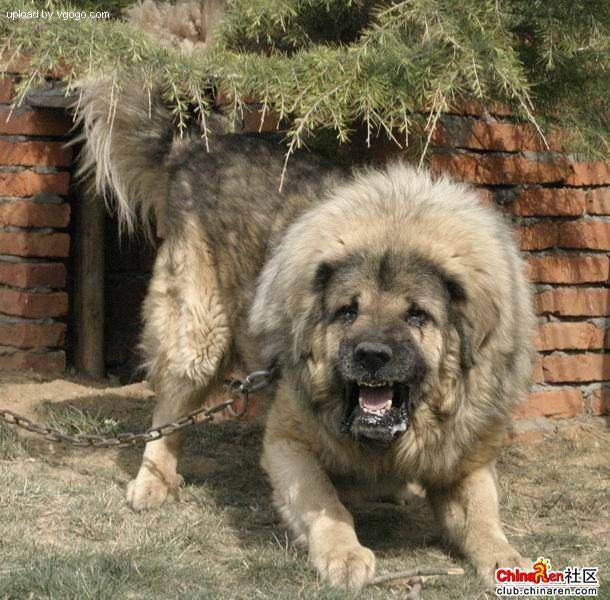

In [ ]:
# Try out loading images from the filenames list
Image(filenames[9000])

Since we've now got out training image filepaths in a list, lets prepare our labels.

In [ ]:
import numpy as np
labels = Labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("They are equal")
else:
  print("They are not equal")

In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds.sort()
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:5]

### Creating our own validation set

Since the data from kaggle doesn't come with it's validation set, We would create our own


In [ ]:
# Setup X and Y variables
X = filenames
Y = boolean_labels

To save time between experiments, We would start with 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES =  4800 #@param {type:"slider", min:1000, max:10222, step:100}

In [ ]:
# Let's split our data into training and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size
X_train, X_val, Y_train, Y_val = train_test_split(
    X[:NUM_IMAGES],
    Y[:NUM_IMAGES],
    test_size=0.2,
    random_state=42
)
len(X_train), len(Y_train), len(X_val), len(Y_val)

(800, 800, 200, 200)

### Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors, we're going to write a function which does a few tings:
* Take an image filepath as input
* Use tensorflow to read the file and save it to a variable,`image`
* Turn our `image` (a jpg) into Tensors
* Normalize our `image` (convert our color channel values from 0-255 to 0-1).
* Resize the `image` to a standard shape of (224, 224)
* Return the modified image

In [ ]:
# Before we create a function, lets see what importing an image looks like
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

Now we've seen what an image looks like as a tesnor, let's now make a functions to preprocess them

In [ ]:
# define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image, img_size=IMG_SIZE):
  """Takes an image file path and turns the image into a Tensor"""
  # Read in an image file
  image = tf.io.read_file(image)
  # Turn the Jpeg image into numerical Tensors with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values(Normalize)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired values (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches
Why turn our data into batches?
All 10,000+ images might not fit into memory in one go....
So thats why we do 32(this is the batch size) at a time(You can adjust the batch size if need be).
In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple(image, label)
def get_image_label(image_path, label):
  """Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)"""
  image = process_image(image_path)
  return image, label

Now we've got a way to turn our data into tuple of Tensors in the form: `(image, label)`, Let's make a function to turn all our data (`X` & `Y`) into batches

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image(X) and label (Y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test data, we probably don't have labels
  if test_data:
    print("Creating the test data batches......")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # Filepaths
                                               tf.constant(y))) # Labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # if the data is training, we shuffle it!
  else:
    print("Creating training data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    # Create (image, label) tuples (this also turns the imaeg path into preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create traning and validation dataset
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating training data batches....
Creating validation data batches....


# **Visualizing Data Batches**
Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_images(images, labels):
  """
  Displays a plot of images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(12, 12))
  # Loop through images(25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

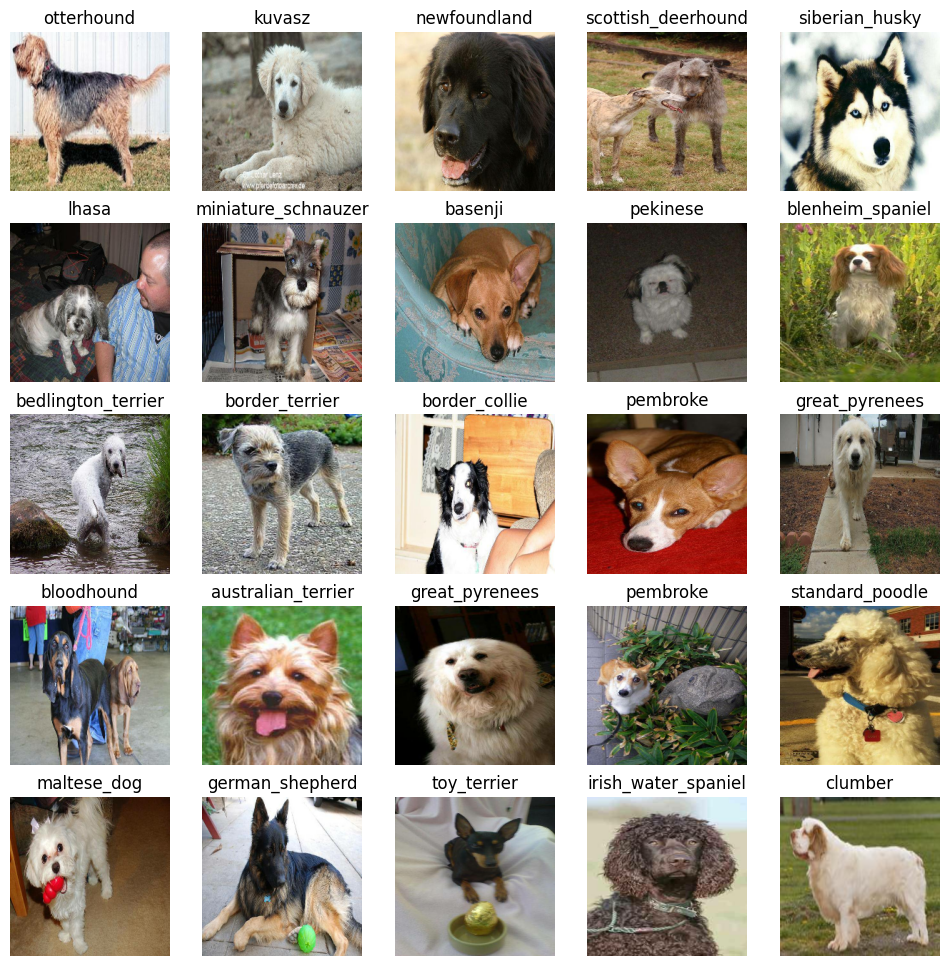

In [ ]:
# convert train_data to a numpy iterator and grab the first batch
train_images, train_labels = next(train_data.as_numpy_iterator())
# Now let's visualize the data in a training batch
show_images(train_images, train_labels)

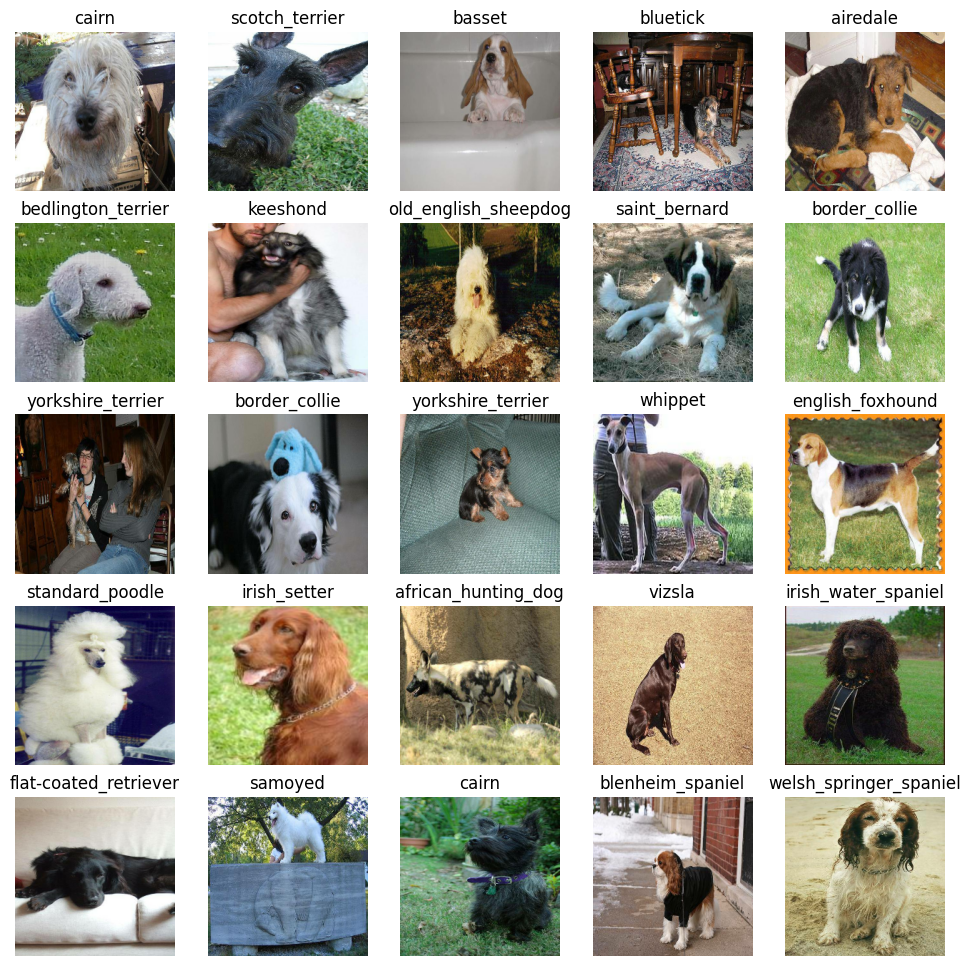

In [ ]:
# Convert validation dataset into interators and grab in batches
val_images, val_labels = next(val_data.as_numpy_iterator())
# Now let's visualize the data in a validation batch
show_images(val_images, val_labels)

## Building a Model
Before we build a model, there are a few things we need to define:


1.   The input shape ( our images shape, in the form of tensors) to our model.
2.   The output shape (Image labels, in the form of Tensors) of our model.
3.   The URL of the model we want to use(MobileNetV3).




In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels
# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

Now we've got our imputs, outputs and model ready to go. Let's put them together into a keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* returns the model.


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE):
    """
    Creates a transfer learning model using MobileNetV2 and returns the trained model
    """

    # Load the pretrained MobileNetV2 model without the top classification layer
    # 'weights=imagenet' loads weights trained on ImageNet
    # 'include_top=False' excludes the final dense layer so we can add our own
    base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')

    # Freeze the base model so its weights aren't updated during training
    base_model.trainable = False

    # Create a new model on top of the base
    model = models.Sequential([
        base_model,  # Feature extractor
        layers.GlobalAveragePooling2D(),  # Reduce spatial dimensions to a single vector
        layers.Dense(output_shape, activation='softmax')  # Final classification layer
    ])

    # Compile the model with optimizer, loss function, and evaluation metric
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
model = create_model()
model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save it's progress, check it's progress or stop training early if a model stops improving.

We'll create two callbacks, one for Tensorboards which helps track our progress and another for early stopping which prevents our model from overfitting.

### TensorBoard Callback

To SetUp a TensorBoard Callback, we need to do three things:
* Load the TensorBoard Notebook extension
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
* Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Calling

Early stopping helps our model from overfitting by stopping training if a vcertain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=3
)

## Training a model (on subset of data)

Our first model is only going to train on 1000 models to make sure everything is working before training it on the whole datasets.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's Create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use.
* Return the model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and return the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we t9rain a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - accuracy: 0.0342 - loss: 4.8658 - val_accuracy: 0.2350 - val_loss: 3.6225
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 16s 137ms/step - accuracy: 0.5611 - loss: 2.2420 - val_accuracy: 0.4800 - val_loss: 2.4366
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8879 - loss: 1.0056 - val_accuracy: 0.5650 - val_loss: 1.9650
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - accuracy: 0.9698 - loss: 0.5092 - val_accuracy: 0.5650 - val_loss: 1.7752
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.9956 - loss: 0.3065 - val_accuracy: 0.5800 - val_loss: 1.6721
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 191ms/step - accuracy: 0.9940 - loss: 0.2174 - val_accuracy: 0.6000 - val_loss: 1.6266
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9999 - loss: 0.1487 - val_accuracy: 0.6150 - val_loss: 1.5953
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 134ms/step - accuracy: 1.0000 - loss: 0.1182 - val_accur

### Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = load_1000_image_model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step


array([[4.31075459e-04, 3.26087885e-03, 1.13675480e-04, ...,
        2.03055883e-04, 7.50161998e-05, 3.51490616e-03],
       [5.37759275e-04, 2.15069755e-04, 1.74448488e-03, ...,
        5.72595418e-05, 3.33591504e-03, 4.51417727e-05],
       [1.04125429e-05, 1.05677848e-03, 5.08085417e-04, ...,
        1.02941631e-04, 1.55616908e-05, 7.07728497e-04],
       ...,
       [1.74365833e-03, 1.46350672e-03, 9.85446037e-04, ...,
        5.31092868e-04, 1.90055231e-04, 1.46164466e-03],
       [7.95587606e-04, 5.21324364e-05, 1.27917025e-04, ...,
        3.01866767e-05, 1.14775839e-05, 1.01207355e-02],
       [2.71745492e-04, 5.14647654e-05, 3.37571633e-04, ...,
        8.33195867e-04, 2.94883997e-04, 4.47152823e-04]], dtype=float32)

**Note**: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(pred_probs):
  """
  Turns an array of predictions probabilities into
  """
  return unique_breeds[np.argmax(pred_probs)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'tibetan_terrier'

Now Since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  unbatch the a given batch dataset so we can compare predictions to truth labels
  """
  images = []
  labels = []
  # Loop through the unbatched dataset and append its images and labels to the above list
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

Let's Visualize the validation images and their labels.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the pred prob to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(
      pred_label, np.max(pred_prob)*100,
      true_label),
      color=color)


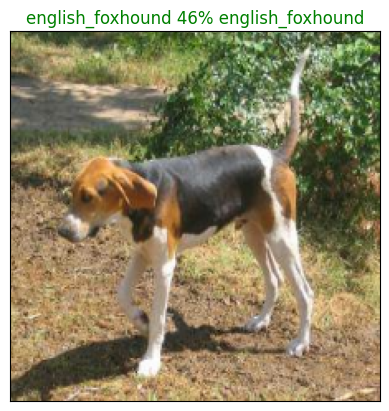

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Now We've got one function to visualize our model's top prediction, lets make another to view our models top 10 predictions

This functions will:
* Takes an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* find the top 10:
  - prediction probabilities indexes
  - prediction probabilities values
  - prediction labels
* plot the top 10 prediction probailities values and labels, coloring the true label given.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup Plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

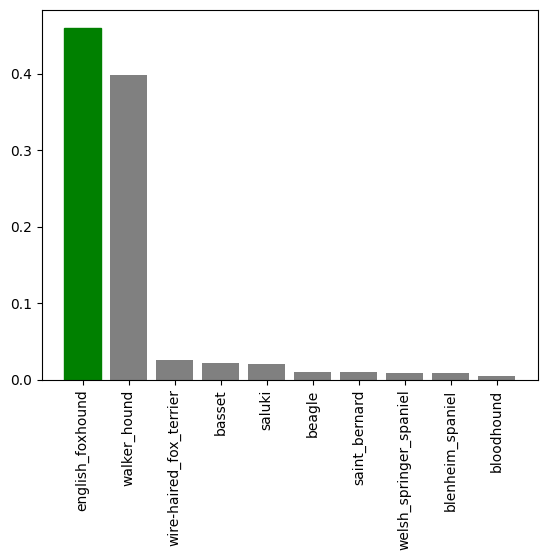

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=42)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

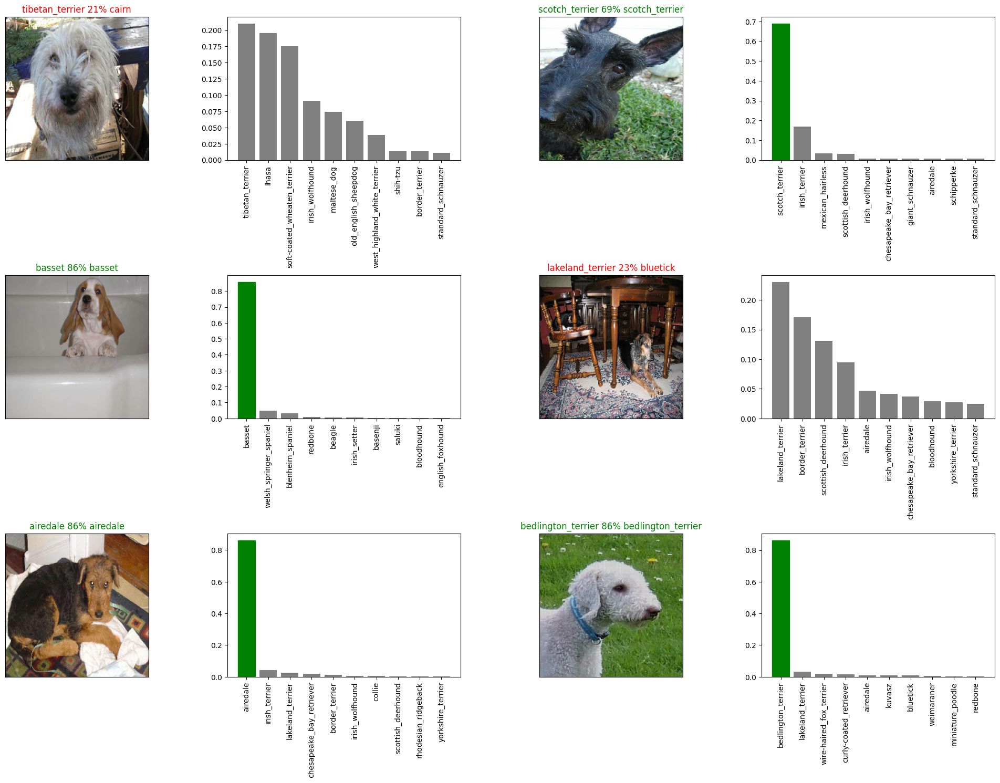

In [ ]:
# Lets check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                  labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"saving model to: {model_path}.....")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(
      model_path,
      custom_objects={"KerasLayer":hub.KerasLayer}
  )
  return model

Now we've got funtions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

saving model to: drive/My Drive/Dog Vision/Models/20250819-21131755638034-1000-images-mobilenetv2-Adam.h5.....


'drive/My Drive/Dog Vision/Models/20250819-21131755638034-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
load_1000_image_model = load_model("drive/My Drive/Dog Vision/Models/20250819-21131755638034-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/Models/20250819-21131755638034-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 209ms/step - accuracy: 0.6349 - loss: 1.4872


[1.5170782804489136, 0.625]

## Training the model on the full data

In [ ]:
# Create data batch with the full dataset
full_data = create_data_batches(X, Y)

Creating training data batches....


In [ ]:
# Create a model for full model
full_model = create_model()

In [ ]:
import os
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on the full dataset, so we can't monitor validation accuracy
full_model_early_stopping =  tf.keras.callbacks.EarlyStopping(
    monitor="accuracy",
    patience=3
)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1900s 6s/step - accuracy: 0.4438 - loss: 2.5150
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - accuracy: 0.8345 - loss: 0.5796
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - accuracy: 0.8948 - loss: 0.3758
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 38s 118ms/step - accuracy: 0.9434 - loss: 0.2498
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - accuracy: 0.9687 - loss: 0.1773
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 128ms/step - accuracy: 0.9819 - loss: 0.1339
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - accuracy: 0.9905 - loss: 0.0995
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - accuracy: 0.9940 - loss: 0.0778
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - accuracy: 0.9970 - loss: 0.0631
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.9980 - loss: 0.0492
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - accuracy: 0.9988 - loss: 0.0397
Epoch 12/

In [ ]:
save_model(full_model, suffix="Full-model")

saving model to: drive/My Drive/Dog Vision/Models/20250821-20581755809887-Full-model.h5.....


'drive/My Drive/Dog Vision/Models/20250821-20581755809887-Full-model.h5'

In [ ]:
load_full_model = load_model("drive/My Drive/Dog Vision/Models/20250821-20581755809887-Full-model.h5")

Loading saved model from: drive/My Drive/Dog Vision/Models/20250821-20581755809887-Full-model.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of tensor batches, we would have to get our test data into the same shape.

Use the `Create_data_batches` to convert test data batches into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches` and setting the `test_data` parameter to `True` (Since the test data does'nt have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
import os
# Load test image file names
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/f0ba9c34158585ceb08138011d40e29a.jpg',
 'drive/My Drive/Dog Vision/test/f367d08148f74a726ce8f1a2c4c38e81.jpg',
 'drive/My Drive/Dog Vision/test/ea8fab5f4003724ac49ea787216998b1.jpg',
 'drive/My Drive/Dog Vision/test/f5319adc463ccf7e82f10a34ce39c190.jpg',
 'drive/My Drive/Dog Vision/test/ec24efc47314fd121b67155b56eabccf.jpg',
 'drive/My Drive/Dog Vision/test/eebf49093e7b0c603ee4c8d67d061352.jpg',
 'drive/My Drive/Dog Vision/test/eb9aebedf9ed7d768a5afb36cd0e2436.jpg',
 'drive/My Drive/Dog Vision/test/edd77b60eb22df1021e726b87c270064.jpg',
 'drive/My Drive/Dog Vision/test/ec63d4730c5cf4b75227e103fea054c3.jpg',
 'drive/My Drive/Dog Vision/test/f33e9ed93787d73091d1c6f4dabc4c46.jpg']

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating the test data batches......


In [ ]:
# Make predictions on the test data using the full model
test_predictions = load_full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 778s 2s/step


In [ ]:
# Save predictions (numpy array) to csv for access later
np.savetxt("drive/My Drive/Dog Vision/test_predictions.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions {numpy array} from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/test_predictions.csv", delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test data for submission

Looking at the kaggle sample submission, we find that it wants our model prediction probability in a csv with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas dataframe with an ID column and a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a csv to submit it on kaggle.

In [ ]:
# Append test image id's to pred_df
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(test_predictions, columns=unique_breeds)
preds_df.insert(0, "id", test_ids)
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f0ba9c34158585ceb08138011d40e29a,2.757732e-12,9.978860e-12,7.090237e-10,2.137889e-13,8.386547e-09,2.493395e-12,5.387903e-13,8.735496e-09,7.731282e-09,...,5.127891e-14,8.500137e-11,1.084214e-11,6.815773e-12,1.838221e-07,3.846494e-13,3.057637e-11,1.504317e-08,2.401771e-11,8.334723e-12
1,f367d08148f74a726ce8f1a2c4c38e81,1.485536e-06,2.396328e-11,1.040681e-07,1.915011e-07,4.286568e-07,2.998537e-09,4.959950e-04,8.331804e-09,2.144115e-09,...,3.810609e-08,1.689039e-05,7.556283e-10,3.599972e-10,8.636762e-09,1.007649e-08,1.637035e-09,2.733289e-09,4.684897e-07,2.929961e-02
2,ea8fab5f4003724ac49ea787216998b1,8.901934e-08,3.720139e-09,1.463607e-08,6.900100e-09,2.396181e-10,9.117770e-11,7.125617e-08,1.064435e-10,3.222226e-10,...,2.914284e-09,3.407534e-07,5.358480e-13,5.108853e-11,3.324675e-10,5.045834e-09,1.793508e-07,4.291233e-08,6.034941e-08,1.188951e-05
3,f5319adc463ccf7e82f10a34ce39c190,1.742429e-10,1.036368e-13,2.751312e-08,6.345996e-13,3.185891e-08,6.312321e-11,4.030125e-12,2.245058e-08,2.321945e-13,...,1.863432e-11,4.386416e-06,1.344202e-10,1.722360e-09,9.871384e-10,1.621180e-13,1.021054e-10,1.549271e-08,7.256103e-11,9.451594e-09
4,ec24efc47314fd121b67155b56eabccf,7.499846e-07,2.582639e-11,3.189793e-10,2.271327e-09,5.510245e-11,1.203576e-10,1.197215e-11,6.120542e-11,1.388204e-13,...,1.212646e-09,8.658318e-12,5.726874e-15,7.301489e-15,1.227473e-10,1.933444e-11,5.325487e-14,2.387389e-08,4.379261e-08,3.956680e-06


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/Predictions.csv",
                index=False)
